# 图像检索任务

## 环境检查

In [1]:
import sys
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

print(f"Python 版本: {sys.version}")
print(f"PyTorch 版本: {torch.__version__}")
print(f"CUDA 可用: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU 型号: {torch.cuda.get_device_name(0)}")
print(f"OpenCV 版本: {cv2.__version__}")

Python 版本: 3.8.20 (default, Oct  3 2024, 15:19:54) [MSC v.1929 64 bit (AMD64)]
PyTorch 版本: 2.4.1+cu118
CUDA 可用: True
GPU 型号: NVIDIA T600 Laptop GPU
OpenCV 版本: 4.10.0


# 1.导入所有库

In [2]:
import os
import pickle
import glob
from collections import defaultdict

import cv2
import numpy as np
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# 设置中文字体（解决图表中文显示问题）
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# 2.配置路径和参数

In [7]:
PROJECT_ROOT = r"D:/CV_Homework"
IMAGE_RETRIEVAL_DIR = os.path.join(PROJECT_ROOT, "image_retrieval")
BASE_DIR = os.path.join(IMAGE_RETRIEVAL_DIR, "base")
QUERY_DIR = os.path.join(IMAGE_RETRIEVAL_DIR, "query")

INDEX_DIR = os.path.join(PROJECT_ROOT, "index")
RETRIEVAL_RESULTS_DIR = os.path.join(PROJECT_ROOT, "results/retrieval")

# 创建必要的目录
os.makedirs(INDEX_DIR, exist_ok=True)
os.makedirs(RETRIEVAL_RESULTS_DIR, exist_ok=True)

# 12个地点缩写
LANDMARK_ABBR = ["fhy", "jx", "kx", "mh", "nm", "sjz", "sy", "tsg", "ty", "yf", "yk", "zx"]
K_VALUES = [20, 40, 60]
DEFAULT_K = 60

print(f"Base 目录: {BASE_DIR}")
print(f"Query 目录: {QUERY_DIR}")
print(f"索引目录: {INDEX_DIR}")
print(f"12 个地标: {LANDMARK_ABBR}")

Base 目录: D:/CV_Homework\image_retrieval\base
Query 目录: D:/CV_Homework\image_retrieval\query
索引目录: D:/CV_Homework\index
12 个地标: ['fhy', 'jx', 'kx', 'mh', 'nm', 'sjz', 'sy', 'tsg', 'ty', 'yf', 'yk', 'zx']


# 3.标签提取函数

In [8]:
def extract_label_from_filename(filename):
    """从文件名提取12个地点缩写之一"""
    basename = os.path.splitext(filename)[0]
    for abbr in LANDMARK_ABBR:
        if basename.startswith(abbr + "_") or basename == abbr or basename.startswith(abbr + "-"):
            return abbr
    return "unknown"

# 测试几个例子
test_files = ["fhy_001.jpg", "sy-20240501.jpg", "jx-fwuirb212342.png", "kx-W8U2T5S7R9P3M6K1.png"]
for f in test_files:
    print(f"{f} -> {extract_label_from_filename(f)}")

fhy_001.jpg -> fhy
sy-20240501.jpg -> sy
jx-fwuirb212342.png -> jx
kx-W8U2T5S7R9P3M6K1.png -> kx


# 4.统计图片数量

In [9]:
def count_images(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                count += 1
    return count

base_count = count_images(BASE_DIR)
query_count = count_images(QUERY_DIR)

print(f"Base 文件夹图片数量: {base_count} 张")
print(f"Query 文件夹图片数量: {query_count} 张")
print(f"总计: {base_count + query_count} 张")

# 统计每个地标在 base 中的数量
label_counts = defaultdict(int)
for root, dirs, files in os.walk(BASE_DIR):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            label = extract_label_from_filename(file)
            if label != "unknown":
                label_counts[label] += 1

print("\n各地标图片数量:")
for label in sorted(label_counts.keys()):
    print(f"  {label}: {label_counts[label]} 张")

Base 文件夹图片数量: 7726 张
Query 文件夹图片数量: 135 张
总计: 7861 张

各地标图片数量:
  fhy: 289 张
  jx: 136 张
  kx: 53 张
  mh: 279 张
  nm: 290 张
  sjz: 295 张
  sy: 293 张
  tsg: 299 张
  ty: 273 张
  yf: 135 张
  yk: 51 张
  zx: 270 张


# 5.定义特征提取器类

In [10]:
class FeatureExtractor:
    def __init__(self, device=None):
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print(f"使用设备: {self.device}")
        
        # 加载预训练 ResNet50
        self.model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
        # 移除最后的全连接层，保留全局平均池化
        self.model = torch.nn.Sequential(*list(self.model.children())[:-1])
        self.model.to(self.device)
        self.model.eval()
        
        # 图像预处理
        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def extract(self, image_path):
        """提取单张图像特征，失败时返回 None"""
        try:
            img = cv2.imread(image_path)
            if img is None:
                return None
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = Image.fromarray(img)
            img_tensor = self.transform(img).unsqueeze(0).to(self.device)
            with torch.no_grad():
                feat = self.model(img_tensor).squeeze().cpu().numpy()
            return feat
        except Exception as e:
            return None

    def batch_extract(self, image_dir):
        """批量提取特征"""
        # 收集所有图片路径
        paths = []
        for root, dirs, files in os.walk(image_dir):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    paths.append(os.path.join(root, file))
        
        print(f"找到 {len(paths)} 张图片")
        
        valid_paths = []
        features = []
        for p in tqdm(paths, desc="提取特征中"):
            feat = self.extract(p)
            if feat is not None:
                valid_paths.append(p)
                features.append(feat)
        
        skipped = len(paths) - len(valid_paths)
        print(f"成功提取 {len(valid_paths)} 张，跳过 {skipped} 张损坏图片")
        return valid_paths, np.array(features)

print("FeatureExtractor 类定义完成！")

FeatureExtractor 类定义完成！


# 6.构建特征索引

In [11]:
# 检查是否已有索引
index_paths = os.path.join(INDEX_DIR, "image_paths.pkl")
index_feats = os.path.join(INDEX_DIR, "features.npy")

if os.path.exists(index_paths) and os.path.exists(index_feats):
    print("发现已有索引，跳过构建。如需重新构建请删除 index 文件夹。")
else:
    print("开始构建索引...")
    extractor = FeatureExtractor()
    paths, features = extractor.batch_extract(BASE_DIR)
    
    # 保存索引
    with open(index_paths, "wb") as f:
        pickle.dump(paths, f)
    np.save(index_feats, features)
    print(f"索引构建完成！共 {len(paths)} 张图片，特征维度 {features.shape[1]}")

开始构建索引...
使用设备: cuda
找到 7726 张图片


提取特征中: 100%|██████████████████████████████████████████████████████████████████| 7726/7726 [20:35<00:00,  6.25it/s]


成功提取 7725 张，跳过 1 张损坏图片
索引构建完成！共 7725 张图片，特征维度 2048


# 7.加载索引

In [12]:
with open(index_paths, "rb") as f:
    image_paths = pickle.load(f)
features = np.load(index_feats)

# L2 归一化
features = features / np.linalg.norm(features, axis=1, keepdims=True)

print(f"加载索引完成！共 {len(image_paths)} 张图片，特征维度 {features.shape[1]}")
print(f"示例图片路径: {image_paths[0]}")

加载索引完成！共 7725 张图片，特征维度 2048
示例图片路径: D:/CV_Homework\image_retrieval\base\BJTU\fhy-0120240508151840.jpg


# 8.执行检索

In [13]:
# 获取所有 query 图片
query_paths = []
for root, dirs, files in os.walk(QUERY_DIR):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            query_paths.append(os.path.join(root, file))

print(f"共 {len(query_paths)} 张查询图片")

# 初始化特征提取器（用于提取 query 特征）
extractor = FeatureExtractor()

# 检索函数
def search(query_path, top_k=60):
    query_feat = extractor.extract(query_path)
    if query_feat is None:
        return None
    query_feat = query_feat / np.linalg.norm(query_feat)
    sim = np.dot(features, query_feat)
    top_idx = np.argsort(sim)[::-1][:top_k]
    results = []
    for idx in top_idx:
        results.append({
            "path": image_paths[idx],
            "filename": os.path.basename(image_paths[idx]),
            "similarity": float(sim[idx])
        })
    return results

# 对前 5 张 query 执行检索（演示）
search_results = {}
for qp in tqdm(query_paths[:5], desc="检索中"):
    qname = os.path.basename(qp)
    search_results[qname] = search(qp, top_k=max(K_VALUES))

print(f"检索完成！共 {len(search_results)} 个结果")

共 135 张查询图片
使用设备: cuda


检索中: 100%|████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00,  6.97it/s]

检索完成！共 5 个结果


# 9.计算 P@K

In [14]:
def compute_precision_at_k(retrieved_files, query_label, k):
    if len(retrieved_files) < k:
        k = len(retrieved_files)
    correct = sum(1 for i in range(k) if extract_label_from_filename(retrieved_files[i]) == query_label)
    return correct / k if k > 0 else 0

# 对全部 query 执行检索并评估（可能需要几分钟）
print("正在对所有 query 进行检索和评估...")
all_results = {}
for qp in tqdm(query_paths, desc="检索全部"):
    qname = os.path.basename(qp)
    all_results[qname] = search(qp, top_k=max(K_VALUES))

# 计算每个地标的 P@K
label_pk = defaultdict(lambda: {k: [] for k in K_VALUES})
for query_img, res_list in all_results.items():
    q_label = extract_label_from_filename(query_img)
    if q_label == "unknown":
        continue
    retrieved_filenames = [r["filename"] for r in res_list]
    for k in K_VALUES:
        pk = compute_precision_at_k(retrieved_filenames, q_label, k)
        label_pk[q_label][k].append(pk)

# 计算平均值
avg_per_label = {}
for label, kdict in label_pk.items():
    avg_per_label[label] = {k: np.mean(vals) for k, vals in kdict.items()}

total_avg = {k: np.mean([avg_per_label[label][k] for label in avg_per_label]) for k in K_VALUES}

# 打印结果
print("\n" + "="*60)
print("  评估结果 (P@K)")
print("="*60)
for label in sorted(avg_per_label.keys()):
    kdict = avg_per_label[label]
    print(f"{label:8s}: P@20={kdict[20]:.3f}, P@40={kdict[40]:.3f}, P@60={kdict[60]:.3f}")

print("-"*60)
print("  总体平均")
print("-"*60)
for k in K_VALUES:
    print(f"P@{k}: {total_avg[k]:.3f}")
print("="*60)

# 保存检索结果
with open(os.path.join(INDEX_DIR, "search_results.pkl"), "wb") as f:
    pickle.dump(all_results, f)
print(f"检索结果已保存到 {INDEX_DIR}/search_results.pkl")

正在对所有 query 进行检索和评估...


检索全部: 100%|██████████████████████████████████████████████████████████████████████| 135/135 [00:22<00:00,  5.88it/s]


  评估结果 (P@K)
fhy     : P@20=0.937, P@40=0.910, P@60=0.883
jx      : P@20=0.764, P@40=0.632, P@60=0.536
kx      : P@20=0.175, P@40=0.113, P@60=0.083
mh      : P@20=0.893, P@40=0.848, P@60=0.815
nm      : P@20=0.980, P@40=0.972, P@60=0.959
sjz     : P@20=0.957, P@40=0.940, P@60=0.931
sy      : P@20=0.820, P@40=0.750, P@60=0.704
tsg     : P@20=0.903, P@40=0.838, P@60=0.769
ty      : P@20=0.918, P@40=0.912, P@60=0.880
yf      : P@20=0.607, P@40=0.482, P@60=0.417
yk      : P@20=0.750, P@40=0.500, P@60=0.400
zx      : P@20=0.889, P@40=0.848, P@60=0.824
------------------------------------------------------------
  总体平均
------------------------------------------------------------
P@20: 0.799
P@40: 0.729
P@60: 0.683
检索结果已保存到 D:/CV_Homework\index/search_results.pkl


# 10.生成12张 P@K 柱状图

已生成: D:/CV_Homework\results\P@K_charts\P@K_fhy.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_jx.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_kx.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_mh.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_nm.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_sjz.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_sy.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_tsg.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_ty.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_yf.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_yk.png
已生成: D:/CV_Homework\results\P@K_charts\P@K_zx.png

所有柱状图已保存到: D:/CV_Homework\results\P@K_charts

FHY


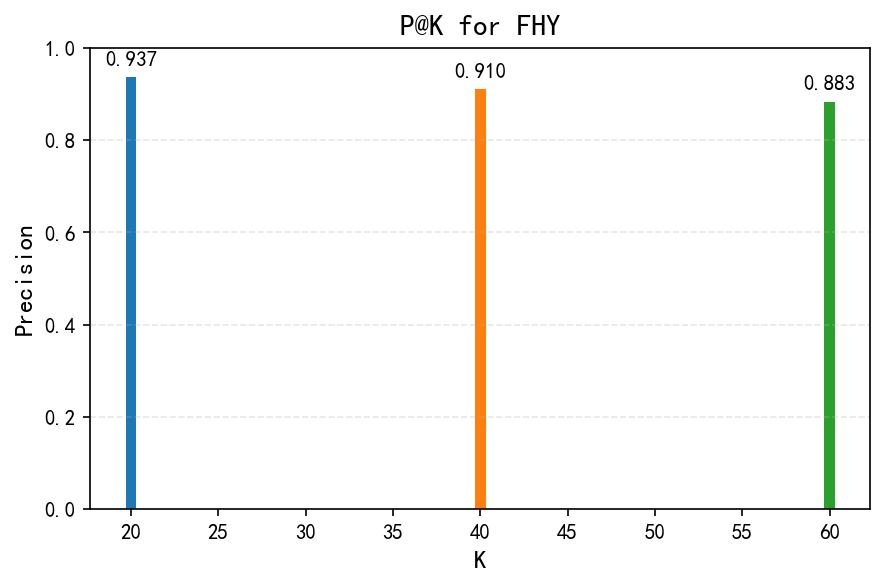


JX


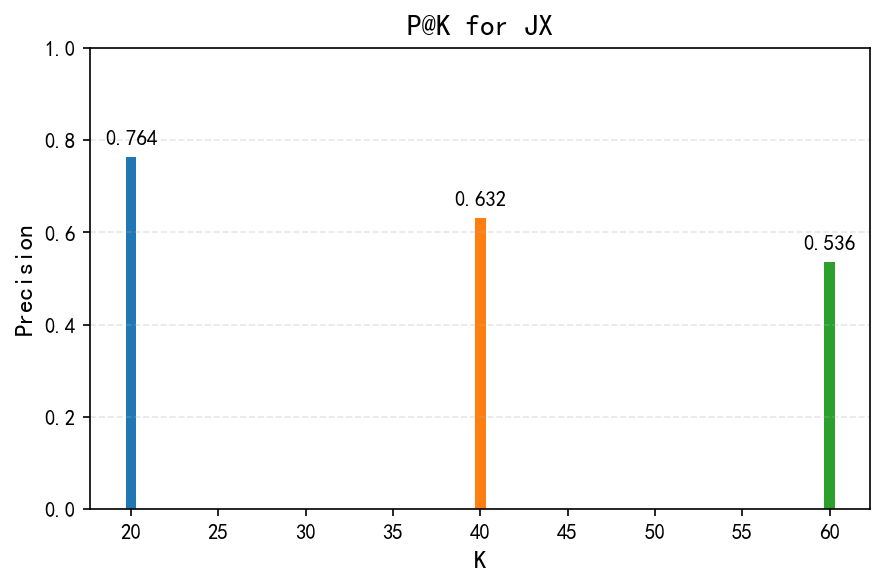


KX


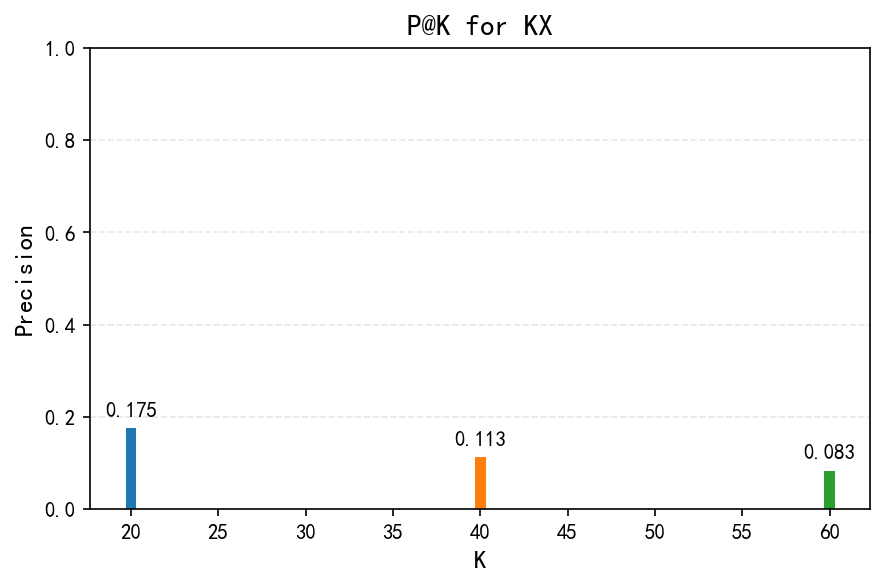


MH


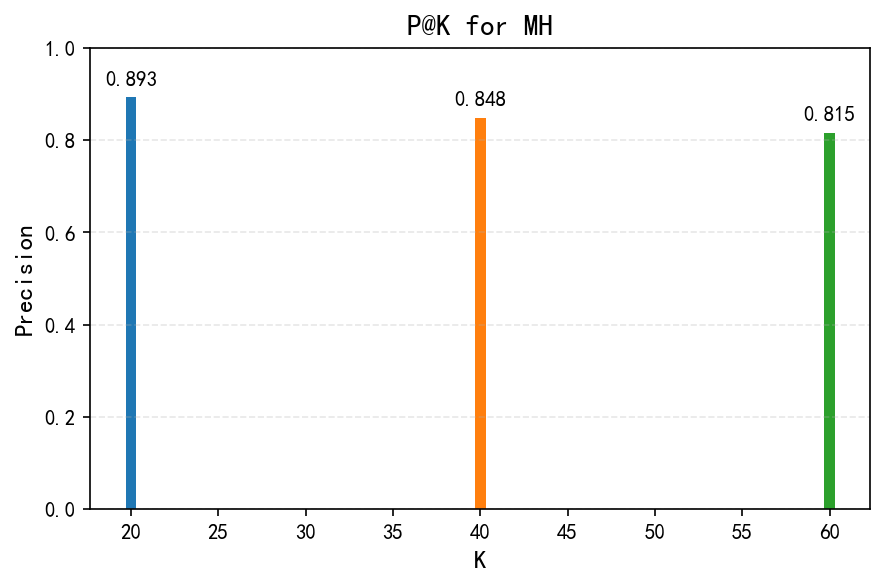


NM


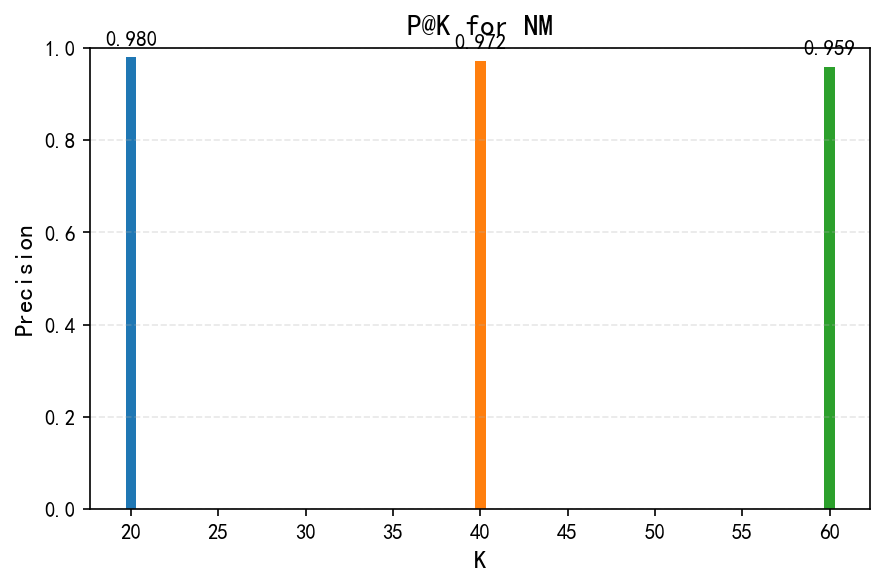


SJZ


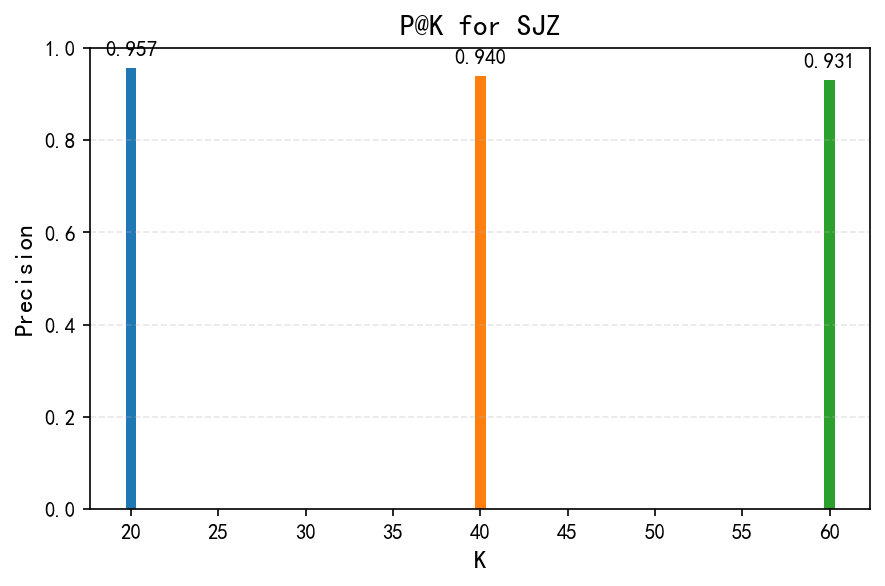


SY


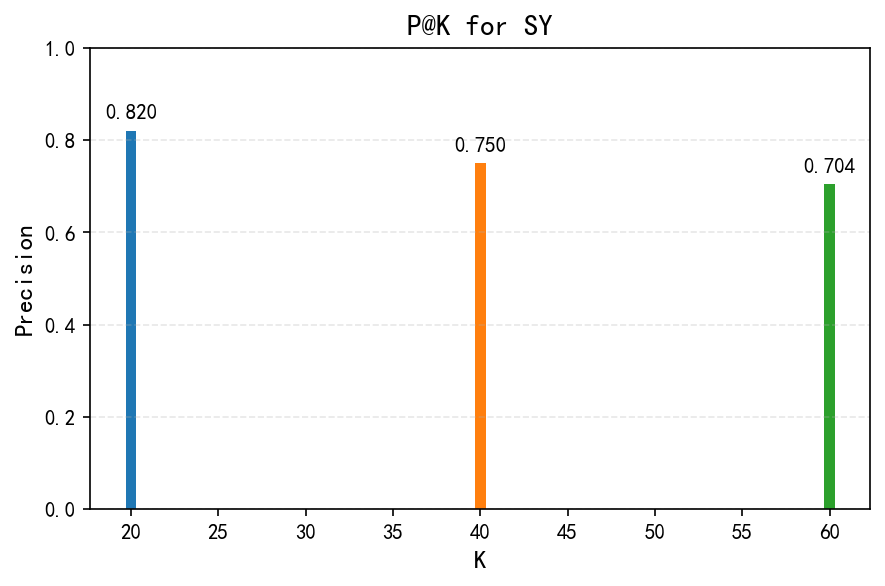


TSG


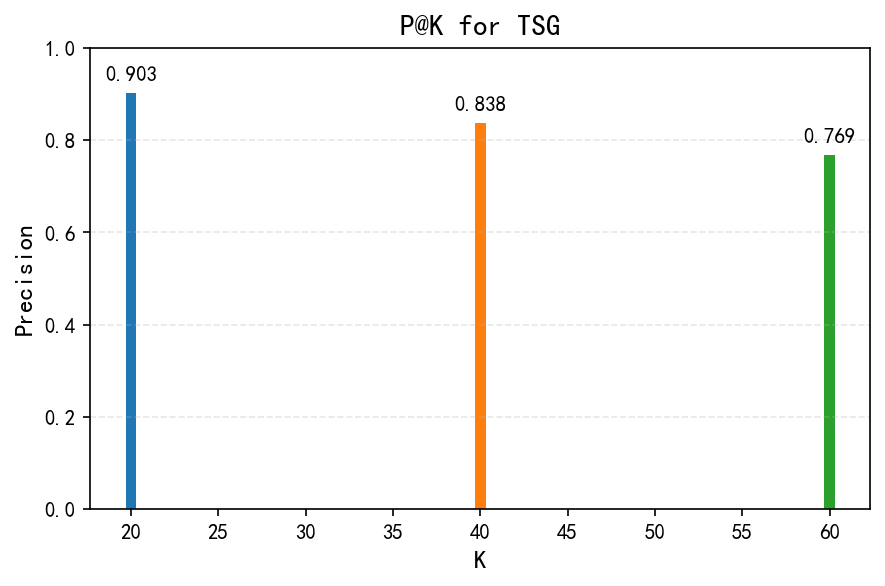


TY


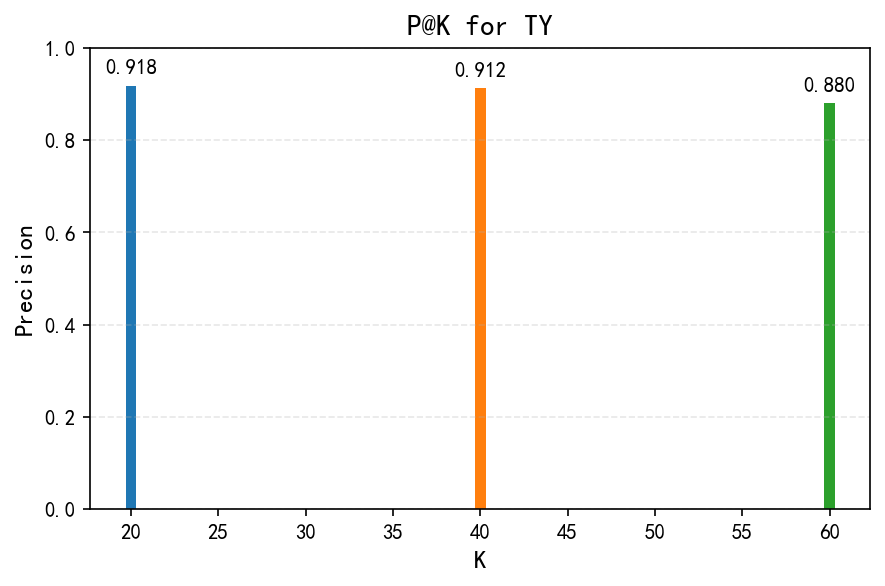


YF


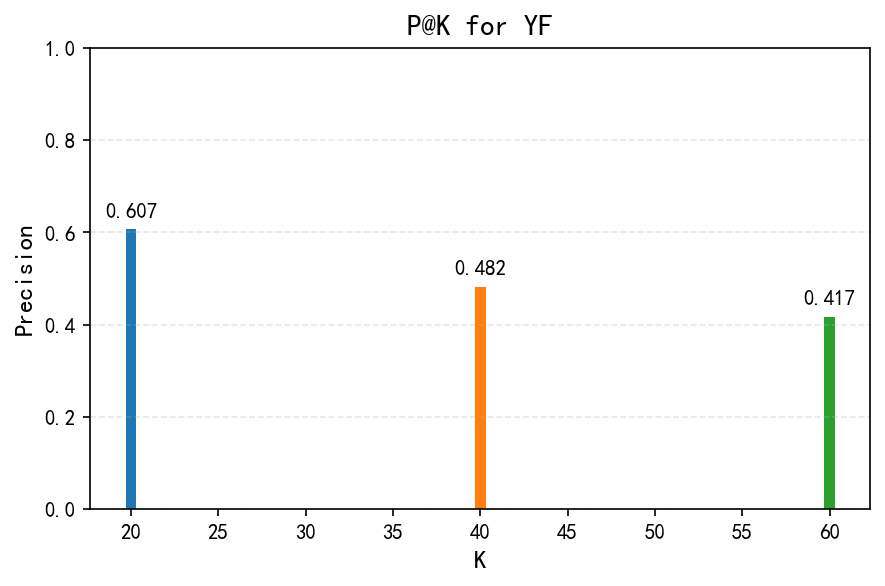


YK


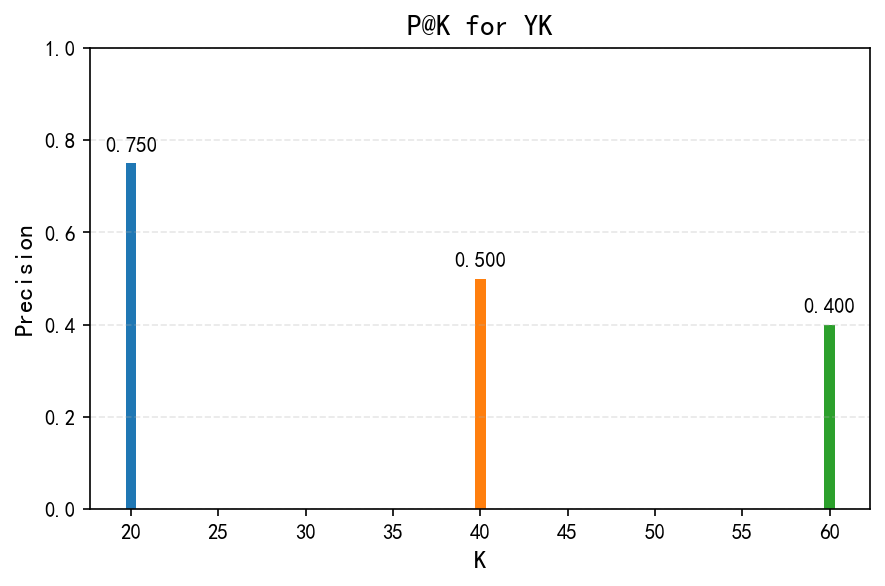


ZX


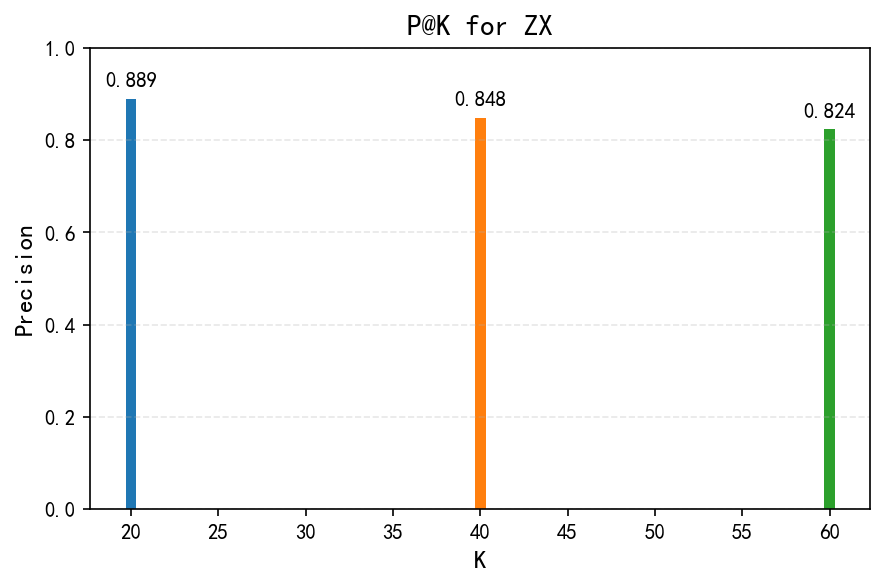

In [15]:
CHART_DIR = os.path.join(PROJECT_ROOT, "results", "P@K_charts")
os.makedirs(CHART_DIR, exist_ok=True)

def plot_bar_chart(label, pk_data, save_path):
    k_values = sorted(pk_data.keys())
    values = [pk_data[k] for k in k_values]
    
    plt.figure(figsize=(6, 4))
    bars = plt.bar(k_values, values, color=['#1f77b4', '#ff7f0e', '#2ca02c'], width=0.6)
    plt.ylim(0, 1.0)
    plt.ylabel('Precision', fontsize=12)
    plt.xlabel('K', fontsize=12)
    plt.title(f'P@K for {label.upper()}', fontsize=14, fontweight='bold')
    
    for bar, val in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
                f'{val:.3f}', ha='center', va='bottom', fontsize=10)
    
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()

# 生成所有柱状图
for label, pk_data in avg_per_label.items():
    save_path = os.path.join(CHART_DIR, f"P@K_{label}.png")
    plot_bar_chart(label, pk_data, save_path)
    print(f"已生成: {save_path}")

print(f"\n所有柱状图已保存到: {CHART_DIR}")

# 显示所有柱状图
from IPython.display import Image as IPImage, display

for label in sorted(avg_per_label.keys()):
    img_path = os.path.join(CHART_DIR, f"P@K_{label}.png")
    print(f"\n{label.upper()}")
    display(IPImage(img_path, width=400))

# 11.可视化检索结果

共有 135 个查询结果
保存目录: D:/CV_Homework\results/retrieval

处理第 1 个查询: fhy-12k4jb1k421.jpg
  保存路径: D:/CV_Homework\results/retrieval\retrieval_fhy-12k4jb1k421.png
已保存到: D:/CV_Homework\results/retrieval\retrieval_fhy-12k4jb1k421.png


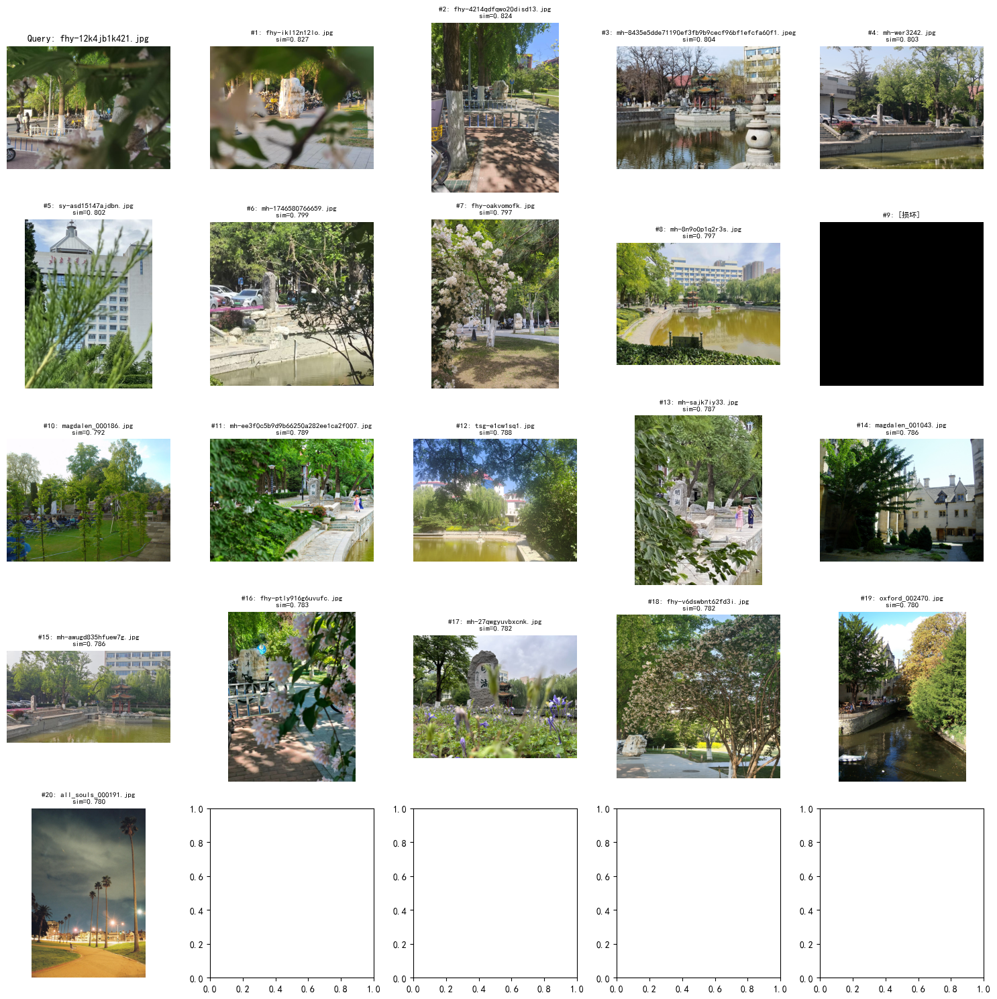


处理第 2 个查询: fhy-20250506194938.jpg
  保存路径: D:/CV_Homework\results/retrieval\retrieval_fhy-20250506194938.png
已保存到: D:/CV_Homework\results/retrieval\retrieval_fhy-20250506194938.png


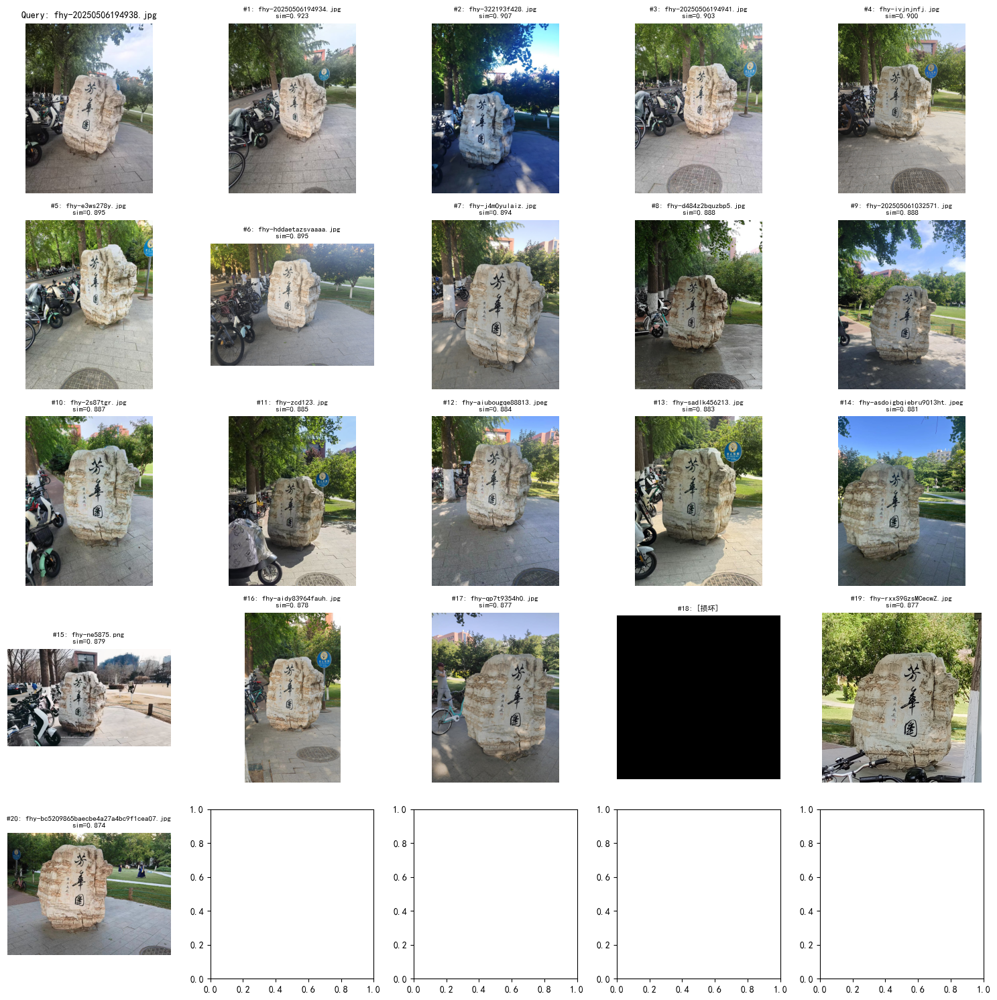


处理第 3 个查询: fhy-202505071933041.jpg
  保存路径: D:/CV_Homework\results/retrieval\retrieval_fhy-202505071933041.png
已保存到: D:/CV_Homework\results/retrieval\retrieval_fhy-202505071933041.png


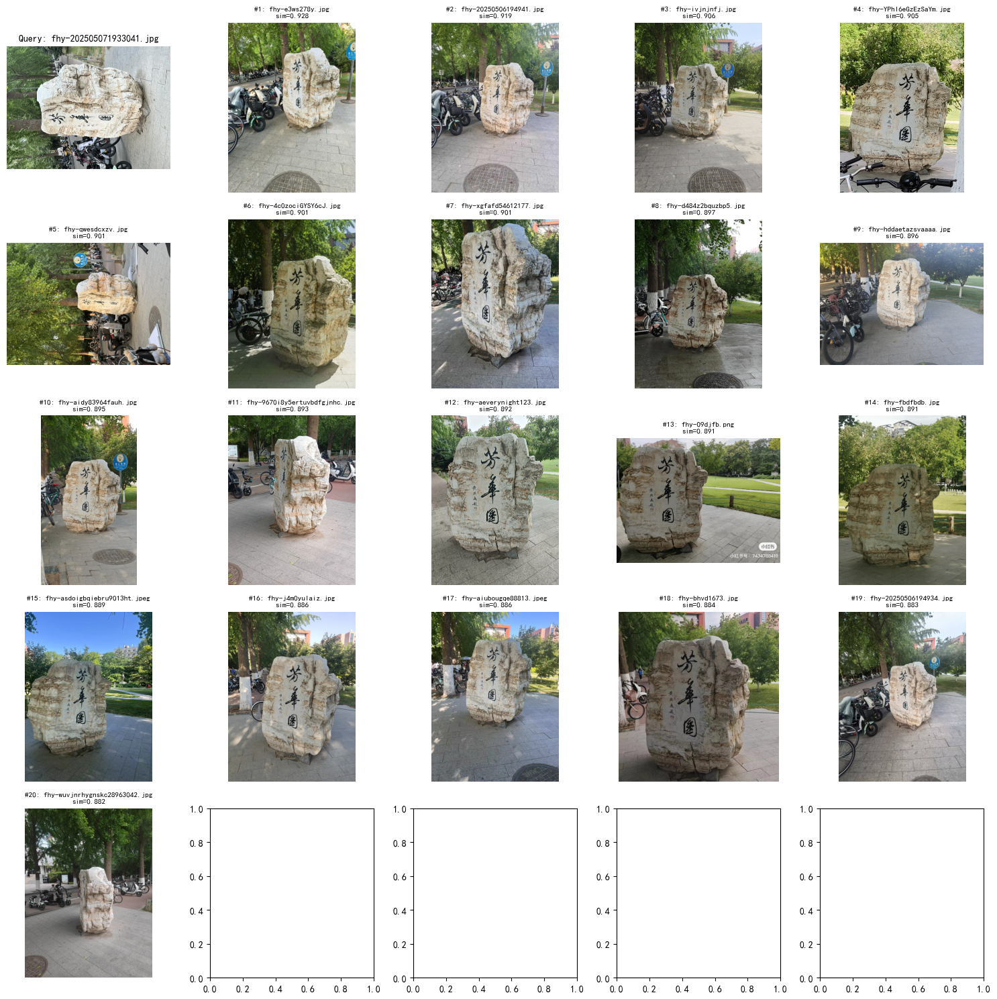


处理第 4 个查询: fhy-20260511140018_130_105(1).jpg
  保存路径: D:/CV_Homework\results/retrieval\retrieval_fhy-20260511140018_130_105(1).png
已保存到: D:/CV_Homework\results/retrieval\retrieval_fhy-20260511140018_130_105(1).png


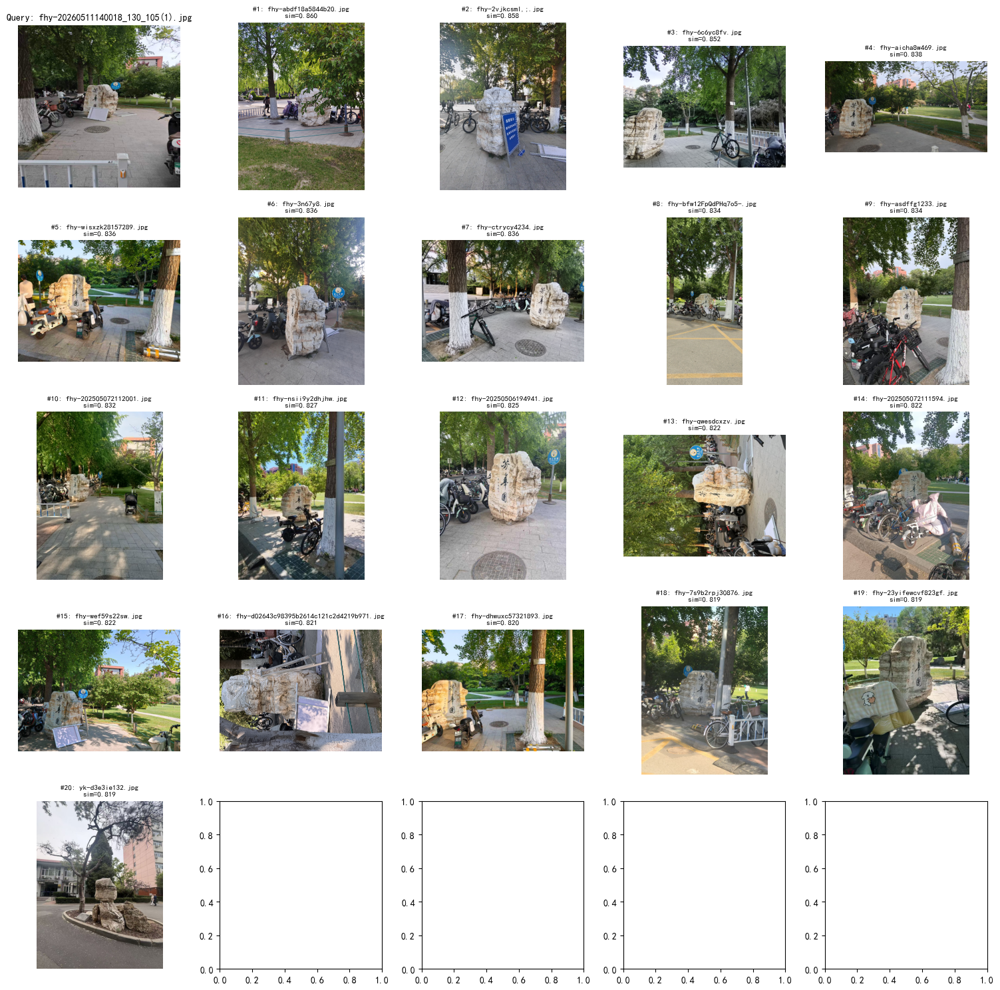


处理第 5 个查询: fhy-2837bfg872vd.jpg
  保存路径: D:/CV_Homework\results/retrieval\retrieval_fhy-2837bfg872vd.png
已保存到: D:/CV_Homework\results/retrieval\retrieval_fhy-2837bfg872vd.png


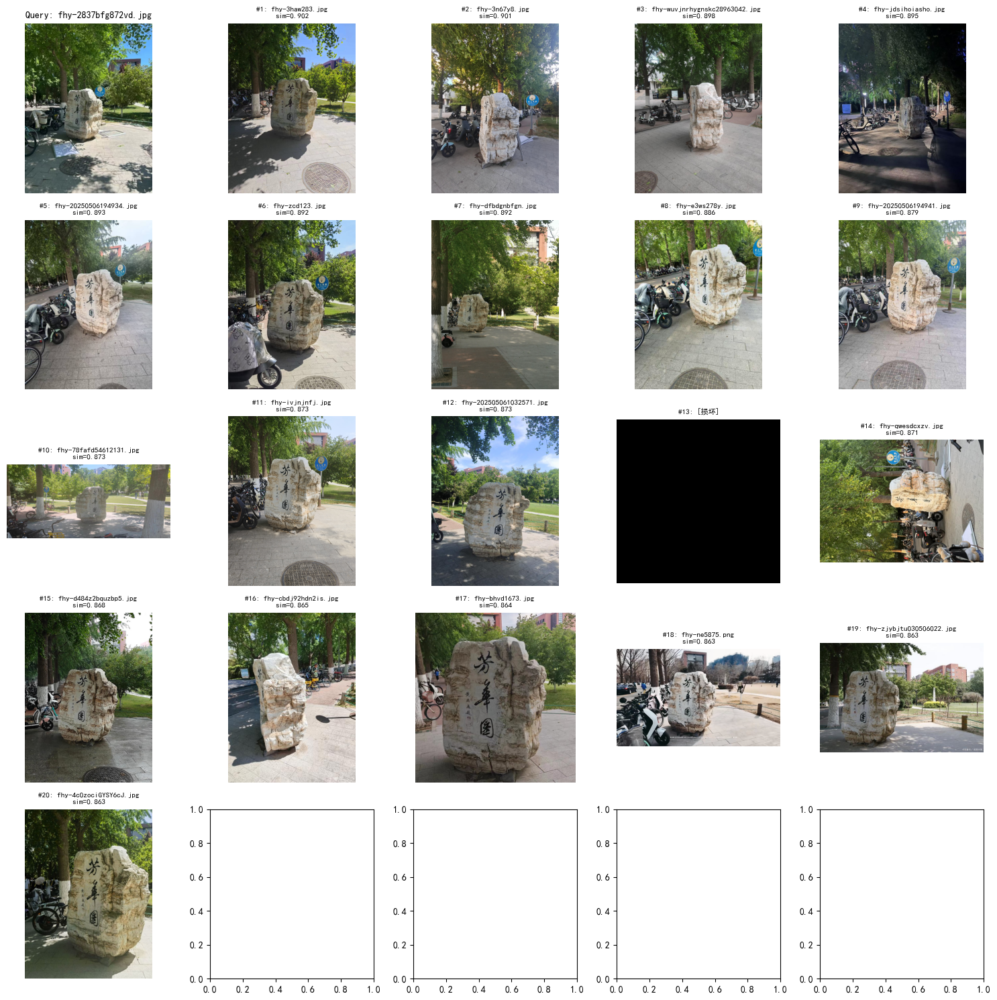


已处理 5 个查询，生成图片保存在: D:/CV_Homework\results/retrieval
生成的图片文件:
   retrieval_fhy-12k4jb1k421.png (4805.6 KB)
   retrieval_fhy-20250506194938.png (4579.2 KB)
   retrieval_fhy-202505071933041.png (4941.2 KB)
   retrieval_fhy-20260511140018_130_105(1).png (5084.4 KB)
   retrieval_fhy-2837bfg872vd.png (4518.2 KB)


In [20]:
import os
import pickle
import matplotlib.pyplot as plt
import numpy as np

# 加载检索结果
with open(os.path.join(INDEX_DIR, "search_results.pkl"), "rb") as f:
    all_results = pickle.load(f)

print(f"共有 {len(all_results)} 个查询结果")
print(f"保存目录: {RETRIEVAL_RESULTS_DIR}")

# 确保目录存在
os.makedirs(RETRIEVAL_RESULTS_DIR, exist_ok=True)

# 显示并保存前5个查询的可视化结果
saved_count = 0
for i, (qname, res_list) in enumerate(all_results.items()):
    if i >= 5:
        break
    
    qpath = os.path.join(QUERY_DIR, qname)
    # 保存路径：将查询图片名中的扩展名替换为 .png
    base_name = os.path.splitext(qname)[0]
    save_path = os.path.join(RETRIEVAL_RESULTS_DIR, f"retrieval_{base_name}.png")
    
    print(f"\n处理第 {i+1} 个查询: {qname}")
    print(f"  保存路径: {save_path}")
    
    # 调用可视化函数并传入 save_path
    visualize_retrieval(qpath, res_list, top_k=20, save_path=save_path)
    saved_count += 1

# 检查生成的文件
print(f"\n{'='*60}")
print(f"已处理 {saved_count} 个查询，生成图片保存在: {RETRIEVAL_RESULTS_DIR}")
print(f"{'='*60}")

# 列出生成的文件
saved_files = [f for f in os.listdir(RETRIEVAL_RESULTS_DIR) if f.endswith('.png')]
if saved_files:
    print("生成的图片文件:")
    for f in saved_files:
        file_path = os.path.join(RETRIEVAL_RESULTS_DIR, f)
        file_size = os.path.getsize(file_path) / 1024  # KB
        print(f"   {f} ({file_size:.1f} KB)")
else:
    print("没有找到生成的图片文件，请检查错误信息")

# 12.检索效果分析

In [17]:
# 找出最好和最差的地标
best_label = max(avg_per_label.keys(), key=lambda x: avg_per_label[x][20])
worst_label = min(avg_per_label.keys(), key=lambda x: avg_per_label[x][20])

print(f"\n表现最好的地标: {best_label.upper()} (P@20={avg_per_label[best_label][20]:.3f})")
print(f"表现最差的地标: {worst_label.upper()} (P@20={avg_per_label[worst_label][20]:.3f})")

# 按 P@20 排序
sorted_labels = sorted(avg_per_label.keys(), key=lambda x: avg_per_label[x][20], reverse=True)
print("\n各地标按 P@20 排名:")
for i, label in enumerate(sorted_labels, 1):
    print(f"  {i:2d}. {label:8s}: P@20={avg_per_label[label][20]:.3f}, P@40={avg_per_label[label][40]:.3f}, P@60={avg_per_label[label][60]:.3f}")

# 统计信息
print(f"\n总平均 P@20: {total_avg[20]:.3f}")
print(f"总平均 P@40: {total_avg[40]:.3f}")
print(f"总平均 P@60: {total_avg[60]:.3f}")


表现最好的地标: NM (P@20=0.980)
表现最差的地标: KX (P@20=0.175)

各地标按 P@20 排名:
   1. nm      : P@20=0.980, P@40=0.972, P@60=0.959
   2. sjz     : P@20=0.957, P@40=0.940, P@60=0.931
   3. fhy     : P@20=0.937, P@40=0.910, P@60=0.883
   4. ty      : P@20=0.918, P@40=0.912, P@60=0.880
   5. tsg     : P@20=0.903, P@40=0.838, P@60=0.769
   6. mh      : P@20=0.893, P@40=0.848, P@60=0.815
   7. zx      : P@20=0.889, P@40=0.848, P@60=0.824
   8. sy      : P@20=0.820, P@40=0.750, P@60=0.704
   9. jx      : P@20=0.764, P@40=0.632, P@60=0.536
  10. yk      : P@20=0.750, P@40=0.500, P@60=0.400
  11. yf      : P@20=0.607, P@40=0.482, P@60=0.417
  12. kx      : P@20=0.175, P@40=0.113, P@60=0.083

总平均 P@20: 0.799
总平均 P@40: 0.729
总平均 P@60: 0.683
